<a href="https://colab.research.google.com/github/IsharaSilva/Prediction-Recommedation-system-for-Potato-Cultivation/blob/main/Final_Version_Detecting_Fungal_Type_Diseases_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install opencv-python

In [2]:
pip install rembg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 90.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.5 MB/s eta 0:00:00


In [3]:
import cv2
from rembg import remove
import matplotlib.pyplot as plt

def convert_image(file_path):
    try:
        image = cv2.imread(file_path)
        # plt.imshow(image)
        # plt.show()
        # image = remove(image)
        image = cv2.resize(image, (200, 200))
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # plt.imshow(gray_image)
        # plt.show()
        return {
            'state':True,
            'image':gray_image
        }
    except:
        return {
            'state': False
        }

In [4]:
pip install -U scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 101.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [5]:
from skimage.feature import local_binary_pattern

def get_lbp_feature(gray_image):
    radius = 1
    n_points = 8 * radius
    lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')
    return lbp

In [6]:
!git clone https://github.com/IsharaSilva/Prediction-Recommedation-system-for-Potato-Cultivation.git

Cloning into 'Prediction-Recommedation-system-for-Potato-Cultivation'...
remote: Enumerating objects: 356, done.
remote: Counting objects: 100% (243/243), done.
remote: Compressing objects: 100% (153/153), done.
remote: Total 356 (delta 156), reused 136 (delta 90), pack-reused 113
Receiving objects: 100% (356/356), 93.50 MiB | 23.03 MiB/s, done.
Resolving deltas: 100% (226/226), done.


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
import os

dir_list = os.listdir("/content/drive/MyDrive/fungal_detection/earlyBlight")
print(dir_list[0])

1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG


In [9]:
image = convert_image('/content/drive/MyDrive/fungal_detection/earlyBlight/'+dir_list[0])
print(image)
lbp = get_lbp_feature(image['image'])

{'state': True, 'image': array([[159, 162, 158, ..., 202, 204, 205],
       [164, 163, 161, ..., 209, 217, 221],
       [160, 156, 161, ..., 208, 218, 225],
       ...,
       [147, 144, 147, ..., 174, 176, 182],
       [148, 145, 148, ..., 171, 174, 182],
       [148, 147, 143, ..., 173, 175, 178]], dtype=uint8)}


In [10]:
###random_calssifier

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import accuracy_score
random_accuracy = []
def random_calssifier(h , y , image_path):
    np.unique(h)
    np.unique(y)

    # Shape of h
    h.shape

    # Reshape h
    h_updated = h.reshape(len(h), -1)
    h_updated.shape

    # Split data into training and testing sets
    htrain, htest, ytrain, ytest = train_test_split(h_updated, y, random_state=10, test_size=.20)

    # Print the shapes of training and testing sets
    htrain.shape, htest.shape

    # Feature scaling
    print(htrain.max(), htrain.min())
    print(htest.max(), htest.min())
    htrain = htrain / 255
    htest = htest / 255
    print(htrain.max(), htrain.min())
    print(htest.max(), htest.min())

    # Feature selection: PCA
    print(htrain.shape, htest.shape)
    pca = PCA(.98)
    pca_train = pca.fit_transform(htrain)
    pca_test = pca.transform(htest)

    # Train the Random Forest model
    rf = RandomForestClassifier(n_estimators=100, random_state=40)
    rf.fit(htrain, ytrain)

    # Evaluate the Random Forest model
    pred = rf.predict(htrain)
    print("Training Score:", accuracy_score(ytrain, pred))
    pred = rf.predict(htest)
    accuracy = accuracy_score(ytest, pred)
    print("Testing Score RandomClassifier:", accuracy)
    random_accuracy.append(accuracy)

    return {
        "rf":rf , "ytrain":ytrain , "ytest":ytest , "pca_train":htrain , "pca_test":htest
    }


In [11]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import accuracy_score
random_accuracy = []
def randome_classifier1(h , y , random_paths , method):
    np.unique(h)
    np.unique(y)

    # Shape of h
    h.shape

    # Reshape h
    h_updated = h.reshape(len(h), -1)
    h_updated.shape

    # Split data into training and testing sets
    htrain, htest, ytrain, ytest = train_test_split(h_updated, y, random_state=10, test_size=.20)

    # Print the shapes of training and testing sets
    htrain.shape, htest.shape

    # Feature scaling
    print(htrain.max(), htrain.min())
    print(htest.max(), htest.min())
    htrain = htrain / 255
    htest = htest / 255
    print(htrain.max(), htrain.min())
    print(htest.max(), htest.min())

    # Feature selection: PCA
    print(htrain.shape, htest.shape)
    pca = PCA(.98)
    pca_train = pca.fit_transform(htrain)
    pca_test = pca.transform(htest)

    # Train the Random Forest model
    rf = RandomForestClassifier(n_estimators=100, random_state=10)
    rf.fit(pca_train, ytrain)

    # Evaluate the Random Forest model
    print("Training Score:", rf.score(pca_train, ytrain))
    print("Testing Score RandomClassifier:", rf.score(pca_test, ytest))

    # Prediction
    pred = rf.predict(pca_test)
    print(h_updated)
    print("transform : ", pca.transform(h_updated))
    print(htest)
    print(pca_test)
    print(pred)
    # if image_path!="":
    # image_path = "lateBlight/0acdc2b2-0dde-4073-8542-6fca275ab974___RS_LB 4857.JPG"
    classes = {0:'earlyBlight', 1:'lateBlight'}
    if method == "lbp":
      for path in random_paths:
        gray_image = convert_image(file_path=path)['image']
        sift = get_lbp_feature(gray_image=gray_image)
        print(sift)
        h = np.array([[]])
        h = np.append(h, sift)
        h2 = np.array([[]])
        h3 = np.concatenate((h2, h.reshape(1, -1)), axis=1)
        print("h : ", h3)
        # img1_pca = pca.transform(h)  # Apply PCA transformation to input image data
        # print("img1 pca : ",img1_pca)
        p = rf.predict(pca.transform(h3))
        print(p)
        plt.imshow(gray_image)
        plt.title(classes[p[0]])
        plt.show()
    elif method == "hog":
      for path in random_paths:
        gray_image = convert_image(file_path=path)['image']
        sift = get_hog_feature(gray_image=gray_image)
        print(sift)
        h = np.array([[]])
        h = np.append(h, sift)
        h2 = np.array([[]])
        h3 = np.concatenate((h2, h.reshape(1, -1)), axis=1)
        print("h : ", h3)
        # img1_pca = pca.transform(h)  # Apply PCA transformation to input image data
        # print("img1 pca : ",img1_pca)
        p = rf.predict(pca.transform(h3))
        print(p)
        plt.imshow(gray_image)
        plt.title(classes[p[0]])
        plt.show()
    elif method == "sift":
      for path in random_paths:
        gray_image = convert_image(file_path=path)['image']
        sift = get_sift_feature(gray_image=gray_image)
        print(sift)
        h = np.array([[]])
        h = np.append(h, sift)
        h2 = np.array([[]])
        h3 = np.concatenate((h2, h.reshape(1, -1)), axis=1)
        print("h : ", h3)
        # img1_pca = pca.transform(h)  # Apply PCA transformation to input image data
        # print("img1 pca : ",img1_pca)
        p = rf.predict(pca.transform(h3))
        print(p)
        plt.imshow(gray_image)
        plt.title(classes[p[0]])
        plt.show()
    return

In [12]:
###get_lbp_output function

import numpy as np

def get_lbp_output(file_paths , random_paths):
    y = []
    radius = 1
    n_points = 8 * radius
    classes = {'earlyBlight': 0, 'lateBlight': 1}
    file_path = file_paths['earlyBlight'][0]
    gray_image = convert_image(file_path=file_path)['image']
    lbp = get_lbp_feature(gray_image=gray_image)
    h = np.array([[]])
    h = np.append(h, lbp.ravel())
    y.append(0)
    file_path = file_paths['earlyBlight'][1]
    gray_image = convert_image(file_path=file_path)['image']
    lbp = get_lbp_feature(gray_image=gray_image)
    h3 = np.array([[]])
    h3 = np.append(h3, lbp.ravel())
    y.append(0)
    appended_array = np.concatenate((h3.reshape(1, -1), h.reshape(1, -1)), axis=0)
    # print(appended_array)
    for clas in classes:
        file_paths_ = file_paths[clas]
        i=0
        for path in file_paths_:
            if clas == "earlyBlight" and i<2:
                i+=1
                continue
            file_path = path
            image_res = convert_image(file_path=file_path)
            # print(image_res['state'])
            if not image_res['state']:
                continue
            gray_image = image_res['image']
            lbp = get_lbp_feature(gray_image=gray_image)
            # print(lbp.ravel())
            h2 = np.array([[]])
            h2 = np.append(h2, lbp.ravel())
            appended_array = np.concatenate((appended_array, h2.reshape(1, -1)), axis=0)
            y.append(classes[clas])


    print(appended_array)
    print(y)
    rf = random_calssifier(appended_array, y,"")
    randome_classifier1(appended_array, y,random_paths , 'lbp')

    return {
        "rf":rf,

    }


In [13]:
###get_hog_feature

from skimage.feature import hog
from skimage import exposure

def get_hog_feature(gray_image):
    hogfv, hog_image = hog(gray_image, orientations=9, pixels_per_cell=(16, 16),
                           cells_per_block=(2, 2), visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 5))

    return hog_image_rescaled

In [14]:
###get_hog_output



import numpy as np

def get_hog_output(file_paths , random_paths):
    y = []
    radius = 1
    n_points = 8 * radius
    classes = {'earlyBlight': 0, 'lateBlight': 1}
    file_path = file_paths['earlyBlight'][0]
    gray_image = convert_image(file_path=file_path)['image']
    hog = get_hog_feature(gray_image=gray_image)
    h = np.array([[]])
    h = np.append(h, hog)
    y.append(0)
    file_path = file_paths['earlyBlight'][1]
    gray_image = convert_image(file_path=file_path)['image']
    hog = get_hog_feature(gray_image=gray_image)
    h3 = np.array([[]])
    h3 = np.append(h3, hog)
    y.append(0)
    appended_array = np.concatenate((h3.reshape(1, -1), h.reshape(1, -1)), axis=0)
    # print(appended_array)
    hist_count = 0
    for clas in classes:
        file_paths_ = file_paths[clas]
        i=0
        for path in file_paths_:
            if clas == "earlyBlight" and i<2:
                i+=1
                continue
            file_path = path
            image_res = convert_image(file_path=file_path)
            # print(image_res['state'])
            if not image_res['state']:
                continue
            gray_image = image_res['image']
            hog = get_hog_feature(gray_image=gray_image)
            # print(hog.ravel())
            h2 = np.array([[]])
            h2 = np.append(h2, hog)
            appended_array = np.concatenate((appended_array, h2.reshape(1, -1)), axis=0)
            y.append(classes[clas])


    print(appended_array)
    print(y)
    rf = random_calssifier(appended_array, y,"")
    randome_classifier1(appended_array, y,random_paths , 'hog')

    return {
        "rf":rf,

    }


In [15]:
###get_css_feature


import cv2
import numpy as np

def get_css_feature(gray_image):
    _, threshold = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)  # Apply Otsu's thresholding

    contours, _ = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)  # Find contours

    css_features = []  # List to store CSS features
    i =0
    if len(contours)<100:
        return "small"
    for contour in contours:
        i+=1
        x, y, w, h = cv2.boundingRect(contour)  # Bounding rectangle coordinates and dimensions

        # Extract CSS features
        css_features.append([x / 100, y / 100, w / 100, h / 100
                             ])
        if i>=100:
            break
    return css_features

In [16]:
###get_css_output

import numpy as np

def get_css_output(file_paths):
    y = []
    radius = 1
    n_points = 8 * radius
    classes = {'earlyBlight': 0, 'lateBlight': 1}
    file_path = file_paths['earlyBlight'][0]
    gray_image = convert_image(file_path=file_path)['image']
    css = get_css_feature(gray_image=gray_image)
    h = np.array([[]])
    h = np.append(h, css)
    y.append(0)
    file_path = file_paths['earlyBlight'][1]
    gray_image = convert_image(file_path=file_path)['image']
    css = get_css_feature(gray_image=gray_image)
    h3 = np.array([[]])
    h3 = np.append(h3, css)
    y.append(0)
    appended_array = np.concatenate((h3.reshape(1, -1), h.reshape(1, -1)), axis=0)
    for clas in classes:
        file_paths_ = file_paths[clas]
        i=0
        for path in file_paths_:
            if clas == "earlyBlight" and i<2:
                i+=1
                continue
            file_path = path
            image_res = convert_image(file_path=file_path)
            if not image_res['state']:
                continue
            gray_image = image_res['image']
            css = get_css_feature(gray_image=gray_image)
            if css == "small":
                continue
            h2 = np.array([[]])
            h2 = np.append(h2, css)
            appended_array = np.concatenate((appended_array, h2.reshape(1, -1)), axis=0)
            y.append(classes[clas])


    print(appended_array)
    print(y)
    rf = random_calssifier(appended_array, y,"")

    return {
        "rf":rf,

    }
    # plt.show()

In [17]:
###get_lbp_hog_output

import numpy as np

def get_lbp_hog_output(file_paths):
    y = []
    radius = 1
    n_points = 8 * radius
    classes = {'earlyBlight': 0, 'lateBlight': 1}
    file_path = file_paths['earlyBlight'][0]
    gray_image = convert_image(file_path=file_path)['image']
    hog = get_hog_feature(gray_image=gray_image)
    h = np.array([[]])
    h = np.append(h, hog)
    y.append(0)
    file_path = file_paths['earlyBlight'][1]
    gray_image = convert_image(file_path=file_path)['image']
    hog = get_hog_feature(gray_image=gray_image)
    h3 = np.array([[]])
    h3 = np.append(h3, hog)
    y.append(0)
    appended_array = np.concatenate((h3.reshape(1, -1), h.reshape(1, -1)), axis=0)
    for clas in classes:
        file_paths_ = file_paths[clas]
        i=0
        for path in file_paths_:
            if clas == "earlyBlight" and i<2:
                i+=1
                continue
            file_path = path
            image_res = convert_image(file_path=file_path)
            if not image_res['state']:
                continue
            gray_image = image_res['image']
            hog = get_hog_feature(gray_image=gray_image)
            h2 = np.array([[]])
            h2 = np.append(h2, hog)
            appended_array = np.concatenate((appended_array, h2.reshape(1, -1)), axis=0)
            y.append(classes[clas])
            lbp = get_lbp_feature(gray_image=gray_image)
            h2 = np.array([[]])
            h2 = np.append(h2, lbp.ravel())
            appended_array = np.concatenate((appended_array, h2.reshape(1, -1)), axis=0)
            y.append(classes[clas])


    print(appended_array)
    print(y)
    rf = random_calssifier(appended_array, y,"")

    return {
        "rf":rf,

    }
    # plt.show()

In [18]:
###get_sift_feature

import cv2

def get_sift_feature(gray_image):

    sift = cv2.SIFT_create()  # Create SIFT object

    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)
    result = descriptors.flatten()
    if len(result)<=25000:
        return "small"
    return descriptors[0:20000][0]

In [19]:
###get_sift_output

import numpy as np

def get_sift_output(file_paths):
    y = []
    radius = 1
    n_points = 8 * radius
    classes = {'earlyBlight': 0, 'lateBlight': 1}
    file_path = file_paths['earlyBlight'][0]
    gray_image = convert_image(file_path=file_path)['image']
    sift = get_sift_feature(gray_image=gray_image)
    h = np.array([[]])
    h = np.append(h, sift)
    y.append(0)
    file_path = file_paths['earlyBlight'][1]
    gray_image = convert_image(file_path=file_path)['image']
    sift = get_sift_feature(gray_image=gray_image)
    h3 = np.array([[]])
    h3 = np.append(h3, sift)
    y.append(0)
    appended_array = np.concatenate((h3.reshape(1, -1), h.reshape(1, -1)), axis=0)
    for clas in classes:
        file_paths_ = file_paths[clas]
        i=0
        for path in file_paths_:
            if clas == "earlyBlight" and i<2:
                i+=1
                continue
            file_path = path
            image_res = convert_image(file_path=file_path)
            if not image_res['state']:
                continue
            gray_image = image_res['image']
            sift = get_sift_feature(gray_image=gray_image)
            # print(sift)
            if sift == "small":
                continue
            h2 = np.array([[]])
            # print(sift['result'])
            h2 = np.append(h2, sift)
            appended_array = np.concatenate((appended_array, h2.reshape(1, -1)), axis=0)
            y.append(classes[clas])


    print(appended_array)
    print(y)
    rf = random_calssifier(appended_array, y,"")

    return {
        "rf":rf,

    }

In [20]:
import os

folder_path = '/content/drive/MyDrive/fungal_detection/earlyBlight'  # Replace with the path to your folder
folder_path2 = '/content/drive/MyDrive/fungal_detection/lateBlight'
# Get the list of files in the folder
file_list = os.listdir(folder_path)
file_list2 = os.listdir(folder_path2)
file_paths_early = []
file_paths_late = []
# Iterate over the files
for file_name in file_list:
    file_path = os.path.join(folder_path, file_name)
    file_paths_early.append(file_path)

for file_name in file_list2:
    file_path = os.path.join(folder_path2, file_name)
    file_paths_late.append(file_path)

def get_file_paths():
    global file_paths_late , file_paths_early
    response = {
        'earlyBlight': file_paths_early[0:100],
        'lateBlight': file_paths_late[0:100]
    }
    return response

In [21]:
import os
import random

folder_path = '/content/drive/MyDrive/fungal_detection/earlyBlight'  # Replace with the path to your folder
folder_path2 = '/content/drive/MyDrive/fungal_detection/lateBlight'
# Get the list of files in the folder
file_list = os.listdir(folder_path)
file_list2 = os.listdir(folder_path2)
file_paths_early = []
file_paths_late = []
# Iterate over the files
for file_name in file_list:
    file_path = os.path.join(folder_path, file_name)
    file_paths_early.append(file_path)

for file_name in file_list2:
    file_path = os.path.join(folder_path2, file_name)
    file_paths_late.append(file_path)

def get_randome_file_paths():
    global file_paths_late , file_paths_early
    randome_files = []
    for i in range(10):
      randome_files.append(random.choice(file_paths_early))
      randome_files.append(random.choice(file_paths_late))
    response = {
        'randomeImages': randome_files
    }
    return response

PreProcess

In [22]:
response = get_file_paths()
print(response)
processed_images_earliBlight = []
processed_images_lateBlight = []
for path in response['earlyBlight']:
  image_res = convert_image(file_path=path)
  # print(image_res['state'])
  if not image_res['state']:
      continue
  gray_image = image_res['image']
  processed_images_earliBlight.append(gray_image)

for path in response['lateBlight']:
  image_res = convert_image(file_path=path)
  # print(image_res['state'])
  if not image_res['state']:
      continue
  gray_image = image_res['image']
  processed_images_lateBlight.append(gray_image)

{'earlyBlight': ['/content/drive/MyDrive/fungal_detection/earlyBlight/1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/060fd5a7-1606-4a59-895b-604c90d6b414___RS_Early.B 7205.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early.B 8170.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/096a2c48-104c-4570-9e34-8dd60aa5ebcf___RS_Early.B 6979.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/08a892eb-19cc-45ea-babc-181b98f89238___RS_Early.B 7367.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/10a3920b-dd04-406d

LBP Implementation

{'earlyBlight': ['/content/drive/MyDrive/fungal_detection/earlyBlight/1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/060fd5a7-1606-4a59-895b-604c90d6b414___RS_Early.B 7205.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early.B 8170.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/096a2c48-104c-4570-9e34-8dd60aa5ebcf___RS_Early.B 6979.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/08a892eb-19cc-45ea-babc-181b98f89238___RS_Early.B 7367.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/10a3920b-dd04-406d

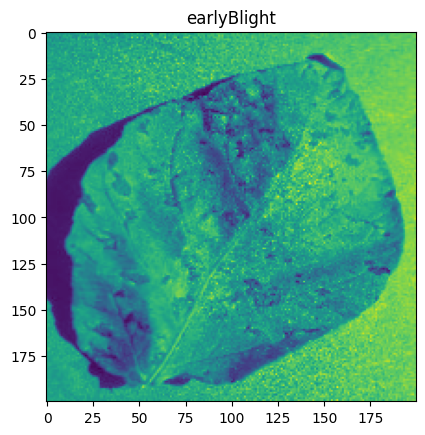

[[3. 4. 1. ... 4. 4. 3.]
 [0. 9. 8. ... 3. 3. 3.]
 [1. 9. 9. ... 1. 0. 3.]
 ...
 [5. 9. 6. ... 9. 5. 1.]
 [0. 7. 8. ... 4. 7. 2.]
 [3. 9. 1. ... 3. 5. 1.]]
h :  [[3. 4. 1. ... 3. 5. 1.]]
[0]


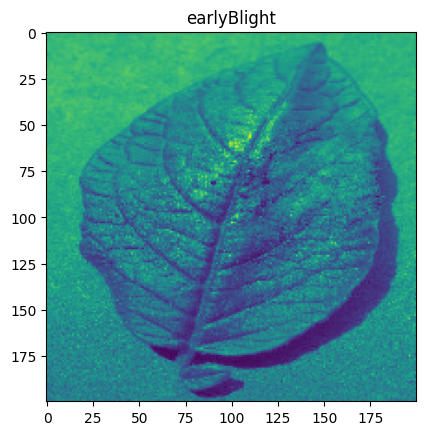

[[3. 1. 4. ... 5. 0. 2.]
 [3. 1. 9. ... 6. 5. 9.]
 [5. 9. 8. ... 3. 8. 2.]
 ...
 [1. 3. 2. ... 6. 6. 1.]
 [5. 7. 5. ... 7. 5. 0.]
 [1. 2. 2. ... 2. 3. 1.]]
h :  [[3. 1. 4. ... 2. 3. 1.]]
[1]


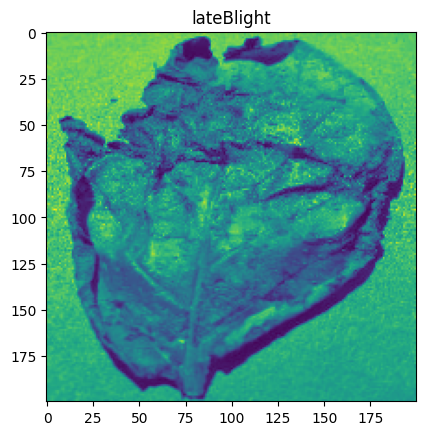

[[3. 1. 3. ... 5. 4. 3.]
 [4. 2. 5. ... 1. 9. 2.]
 [1. 2. 2. ... 8. 5. 2.]
 ...
 [5. 8. 7. ... 5. 1. 1.]
 [1. 3. 4. ... 3. 3. 3.]
 [1. 9. 9. ... 9. 4. 3.]]
h :  [[3. 1. 3. ... 9. 4. 3.]]
[1]


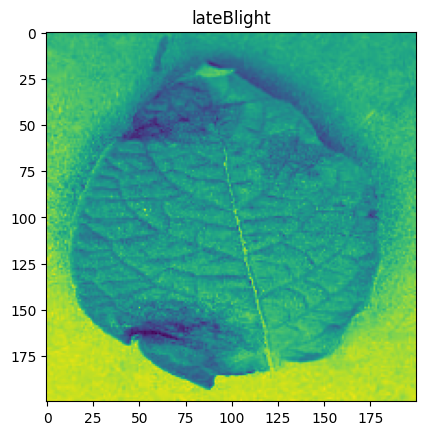

[[3. 9. 0. ... 3. 1. 1.]
 [1. 0. 7. ... 3. 2. 3.]
 [5. 7. 9. ... 9. 5. 5.]
 ...
 [9. 0. 8. ... 0. 9. 0.]
 [5. 9. 7. ... 5. 5. 9.]
 [1. 1. 0. ... 5. 3. 0.]]
h :  [[3. 9. 0. ... 5. 3. 0.]]
[0]


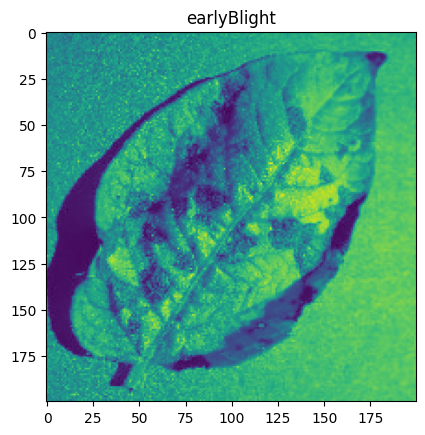

[[0. 2. 1. ... 0. 1. 3.]
 [1. 5. 8. ... 2. 3. 9.]
 [1. 7. 3. ... 6. 7. 1.]
 ...
 [2. 2. 9. ... 9. 5. 3.]
 [4. 6. 7. ... 8. 8. 5.]
 [3. 0. 9. ... 9. 1. 0.]]
h :  [[0. 2. 1. ... 9. 1. 0.]]
[1]


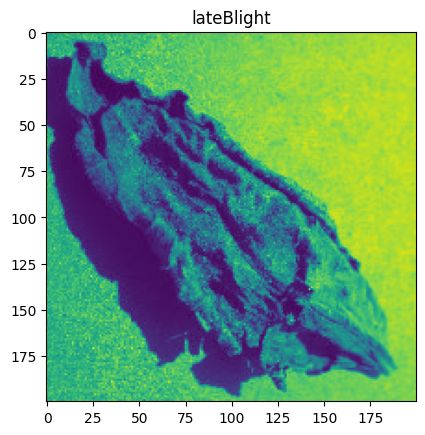

[[1. 1. 4. ... 3. 5. 2.]
 [5. 4. 9. ... 4. 2. 0.]
 [4. 9. 7. ... 3. 4. 1.]
 ...
 [9. 8. 7. ... 4. 3. 1.]
 [0. 3. 6. ... 5. 3. 3.]
 [1. 2. 1. ... 3. 2. 3.]]
h :  [[1. 1. 4. ... 3. 2. 3.]]
[1]


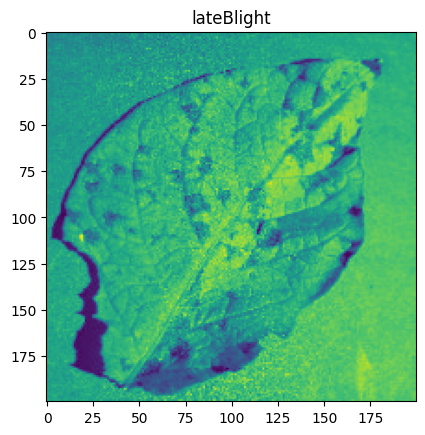

[[0. 2. 9. ... 4. 4. 3.]
 [9. 8. 7. ... 1. 1. 3.]
 [0. 9. 3. ... 6. 9. 3.]
 ...
 [4. 3. 3. ... 0. 7. 0.]
 [0. 5. 6. ... 9. 4. 3.]
 [2. 5. 3. ... 5. 3. 3.]]
h :  [[0. 2. 9. ... 5. 3. 3.]]
[0]


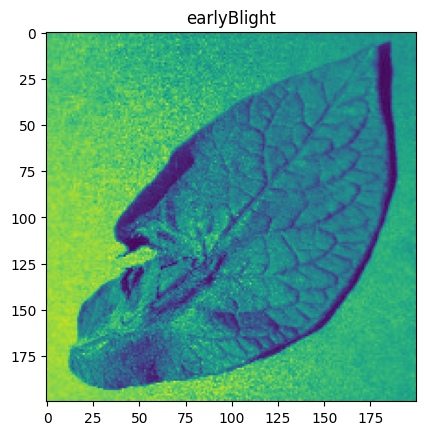

[[2. 5. 4. ... 4. 5. 2.]
 [1. 9. 9. ... 2. 5. 0.]
 [9. 7. 8. ... 3. 5. 1.]
 ...
 [5. 9. 1. ... 0. 9. 1.]
 [3. 9. 7. ... 7. 5. 9.]
 [1. 1. 0. ... 5. 3. 0.]]
h :  [[2. 5. 4. ... 5. 3. 0.]]
[0]


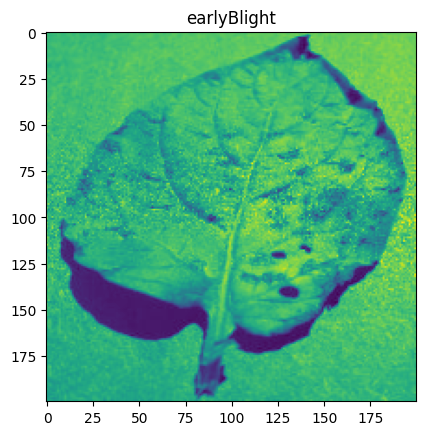

[[2. 5. 5. ... 0. 3. 3.]
 [0. 1. 9. ... 1. 5. 4.]
 [2. 4. 5. ... 9. 1. 1.]
 ...
 [0. 3. 3. ... 3. 4. 5.]
 [1. 3. 5. ... 3. 5. 5.]
 [3. 5. 9. ... 2. 2. 1.]]
h :  [[2. 5. 5. ... 2. 2. 1.]]
[0]


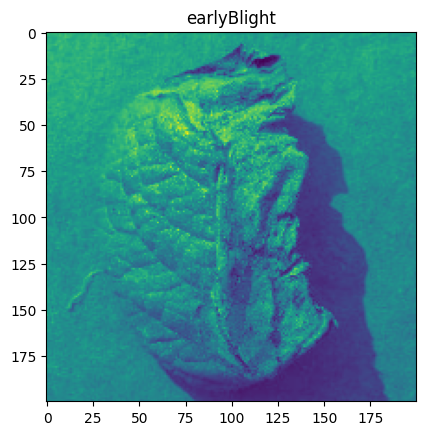

[[0. 4. 5. ... 4. 4. 3.]
 [3. 0. 9. ... 6. 4. 0.]
 [5. 5. 5. ... 6. 3. 5.]
 ...
 [0. 9. 1. ... 6. 5. 1.]
 [3. 5. 0. ... 8. 5. 9.]
 [3. 3. 1. ... 9. 2. 1.]]
h :  [[0. 4. 5. ... 9. 2. 1.]]
[1]


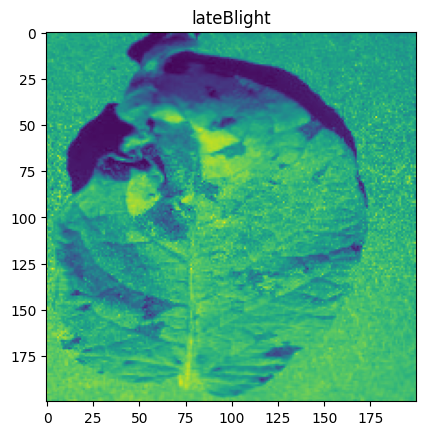

[[1. 5. 2. ... 2. 5. 2.]
 [0. 9. 7. ... 3. 3. 1.]
 [1. 7. 3. ... 6. 5. 1.]
 ...
 [5. 1. 0. ... 6. 9. 0.]
 [2. 9. 8. ... 5. 9. 5.]
 [1. 1. 9. ... 1. 1. 2.]]
h :  [[1. 5. 2. ... 1. 1. 2.]]
[1]


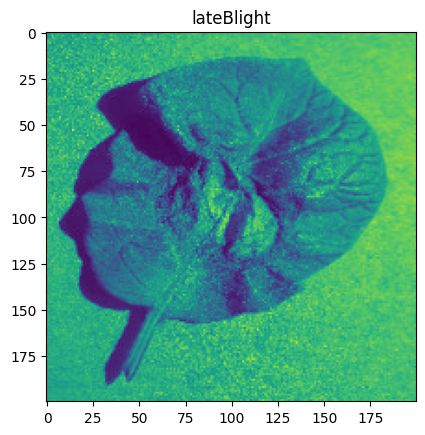

[[1. 1. 0. ... 1. 1. 2.]
 [5. 3. 2. ... 6. 6. 5.]
 [9. 1. 7. ... 6. 6. 4.]
 ...
 [1. 3. 9. ... 9. 5. 4.]
 [0. 2. 6. ... 0. 4. 4.]
 [2. 5. 0. ... 3. 3. 3.]]
h :  [[1. 1. 0. ... 3. 3. 3.]]
[1]


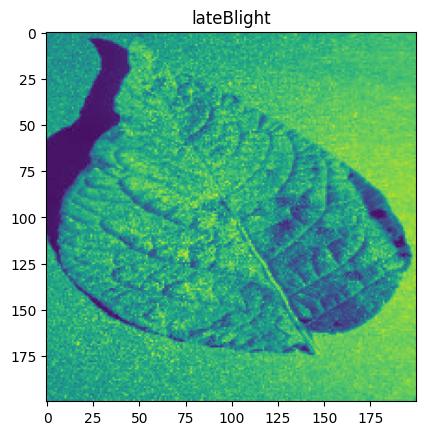

[[2. 5. 5. ... 5. 4. 0.]
 [3. 1. 6. ... 9. 9. 5.]
 [9. 0. 9. ... 3. 2. 3.]
 ...
 [4. 1. 5. ... 9. 5. 3.]
 [5. 5. 5. ... 5. 3. 1.]
 [3. 3. 5. ... 3. 3. 0.]]
h :  [[2. 5. 5. ... 3. 3. 0.]]
[1]


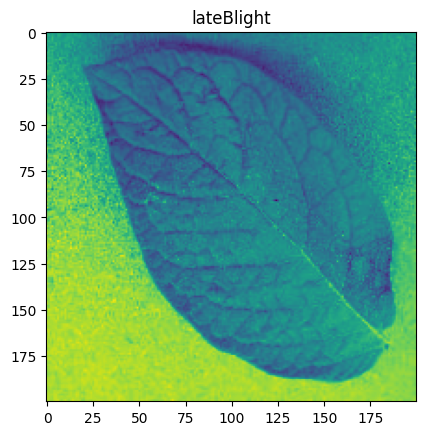

[[3. 2. 3. ... 1. 3. 3.]
 [4. 2. 2. ... 9. 3. 1.]
 [0. 2. 4. ... 3. 5. 3.]
 ...
 [2. 4. 6. ... 9. 1. 0.]
 [5. 9. 7. ... 8. 5. 5.]
 [1. 9. 1. ... 9. 2. 0.]]
h :  [[3. 2. 3. ... 9. 2. 0.]]
[0]


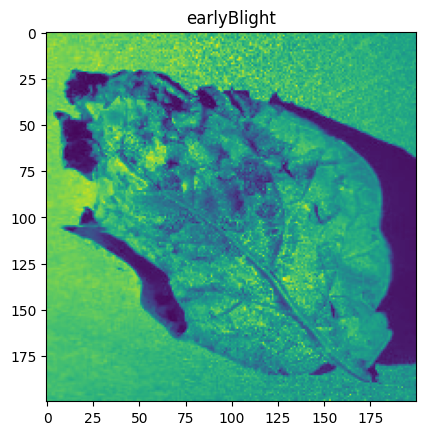

[[9. 1. 9. ... 0. 1. 3.]
 [1. 5. 3. ... 6. 9. 0.]
 [3. 4. 5. ... 7. 9. 5.]
 ...
 [4. 2. 1. ... 1. 7. 1.]
 [5. 3. 1. ... 9. 7. 1.]
 [2. 9. 5. ... 5. 0. 3.]]
h :  [[9. 1. 9. ... 5. 0. 3.]]
[0]


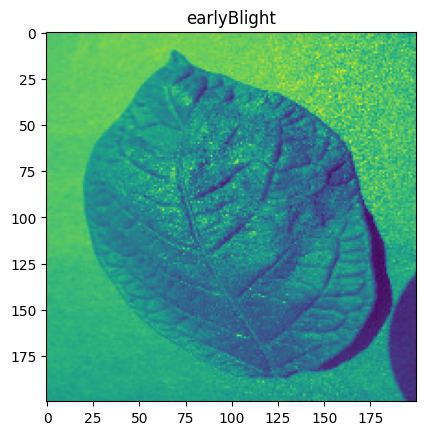

[[1. 5. 4. ... 3. 0. 2.]
 [0. 9. 0. ... 9. 9. 5.]
 [9. 7. 3. ... 0. 5. 4.]
 ...
 [4. 3. 3. ... 8. 7. 0.]
 [4. 1. 8. ... 9. 6. 5.]
 [3. 1. 9. ... 1. 1. 3.]]
h :  [[1. 5. 4. ... 1. 1. 3.]]
[1]


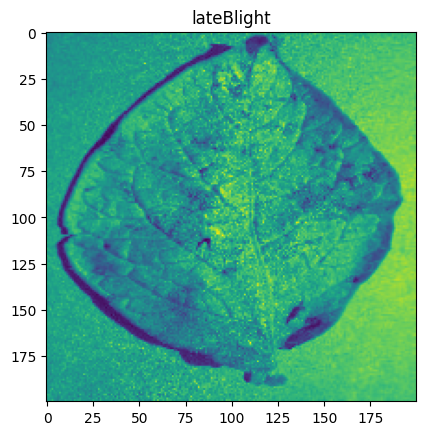

[[2. 1. 4. ... 9. 2. 0.]
 [4. 1. 3. ... 6. 6. 1.]
 [4. 1. 3. ... 6. 6. 1.]
 ...
 [3. 9. 6. ... 2. 9. 0.]
 [5. 0. 7. ... 4. 6. 9.]
 [2. 3. 1. ... 5. 4. 1.]]
h :  [[2. 1. 4. ... 5. 4. 1.]]
[1]


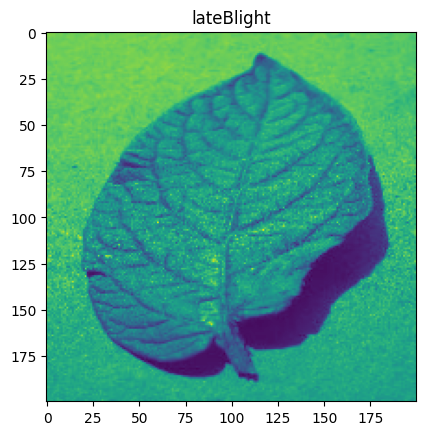

[[1. 0. 2. ... 3. 2. 3.]
 [3. 2. 6. ... 3. 5. 4.]
 [3. 3. 4. ... 5. 5. 5.]
 ...
 [1. 6. 9. ... 4. 8. 0.]
 [4. 6. 1. ... 6. 7. 9.]
 [3. 2. 0. ... 1. 9. 0.]]
h :  [[1. 0. 2. ... 1. 9. 0.]]
[0]


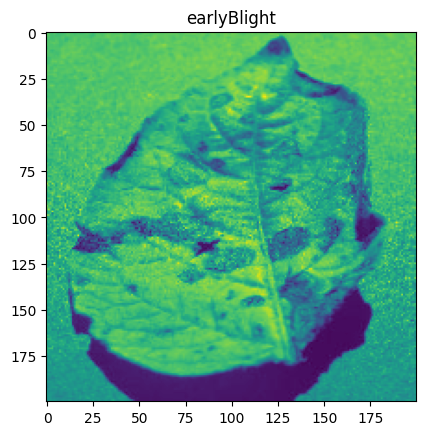

[[9. 9. 9. ... 4. 4. 3.]
 [9. 5. 5. ... 4. 4. 3.]
 [9. 5. 6. ... 1. 3. 3.]
 ...
 [1. 5. 4. ... 4. 7. 9.]
 [9. 8. 7. ... 2. 9. 0.]
 [0. 9. 0. ... 4. 1. 3.]]
h :  [[9. 9. 9. ... 4. 1. 3.]]
[1]


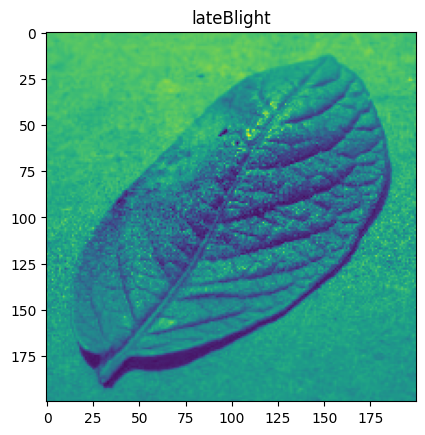

In [23]:
response = get_file_paths()
print(response)
response2 = get_randome_file_paths()
print(response2)
feature_methods = []
feature_methods.append("lbp")
classifier =  get_lbp_output(response , response2['randomeImages'])
rf = classifier['rf']

LBP EVALUATION

Training Precision: 1.0
Testing Precision: 0.55
Training Recall: 1.0
Testing Recall: 0.55
Training F1 Score: 1.0
Testing F1 Score: 0.55


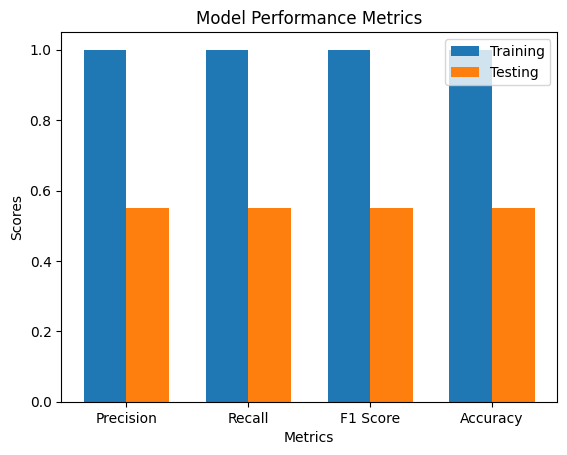

In [24]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate precision, recall, and F1 score on the training and testing data
train_precision = precision_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_precision = precision_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_recall = recall_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_recall = recall_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_f1 = f1_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_f1 = f1_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)

print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)

print("Training F1 Score:", train_f1)
print("Testing F1 Score:", test_f1)

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()

HOG + LBP + CSS IMPLEMENTATION

{'earlyBlight': ['/content/drive/MyDrive/fungal_detection/earlyBlight/1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/060fd5a7-1606-4a59-895b-604c90d6b414___RS_Early.B 7205.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early.B 8170.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/096a2c48-104c-4570-9e34-8dd60aa5ebcf___RS_Early.B 6979.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/08a892eb-19cc-45ea-babc-181b98f89238___RS_Early.B 7367.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/10a3920b-dd04-406d

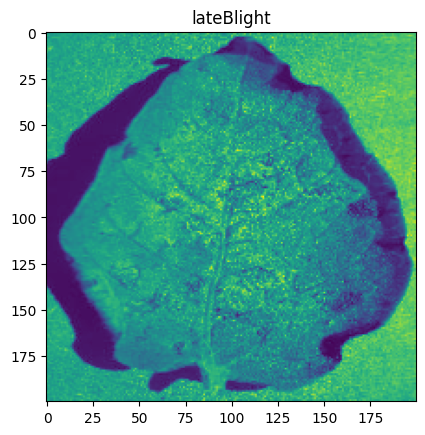

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


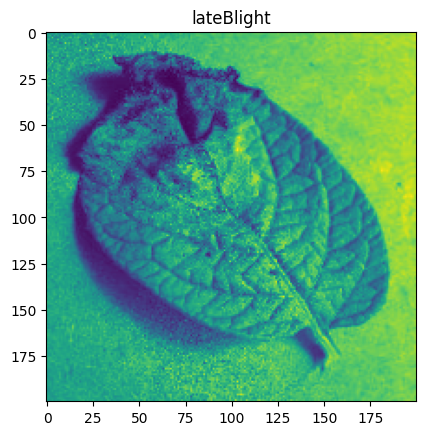

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


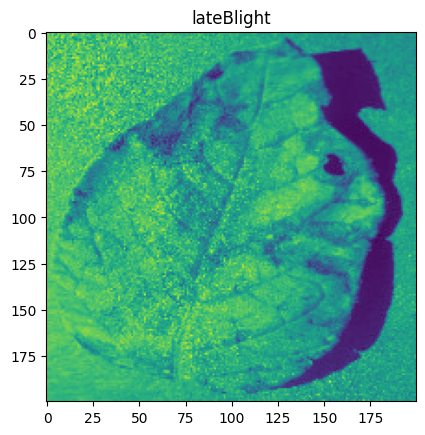

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


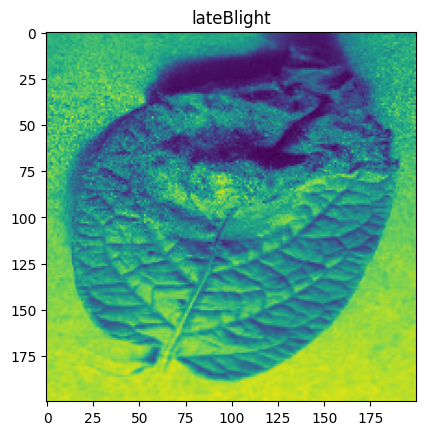

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[0]


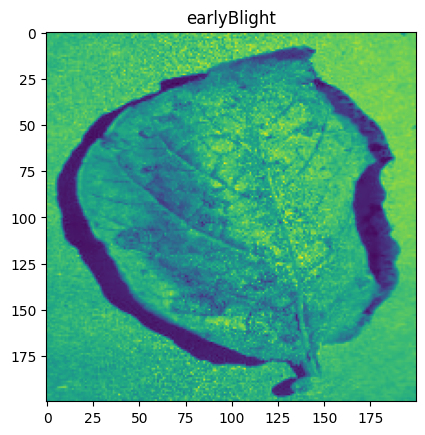

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


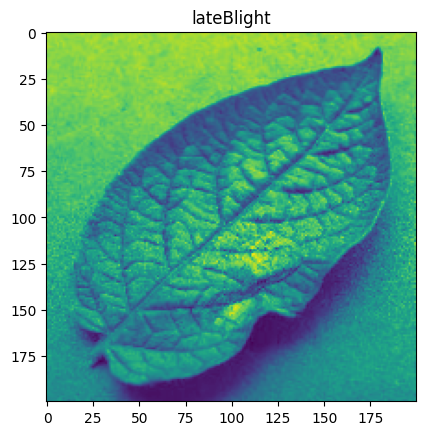

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


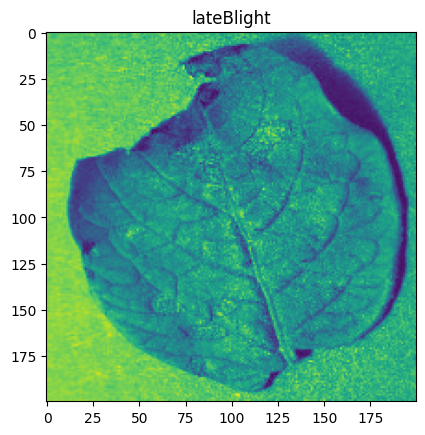

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


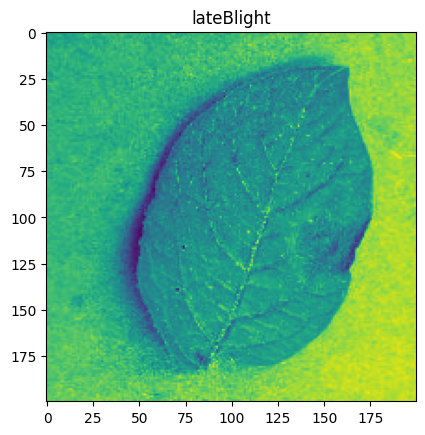

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


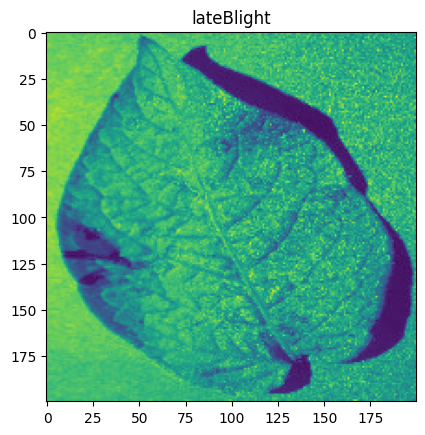

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


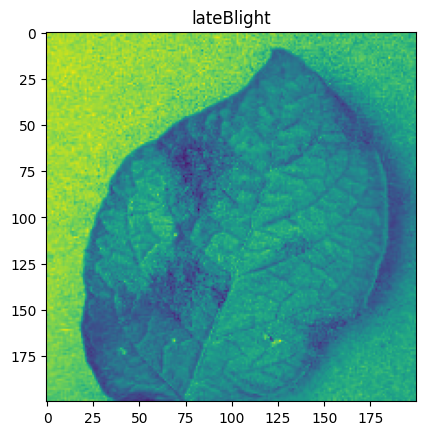

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[0]


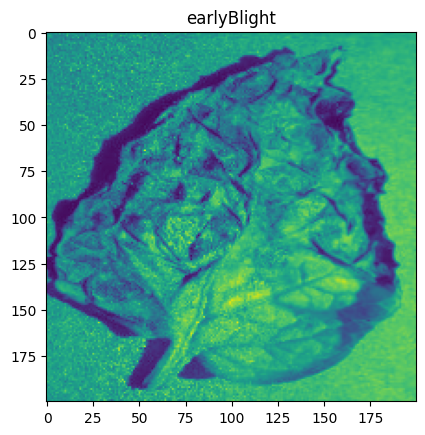

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


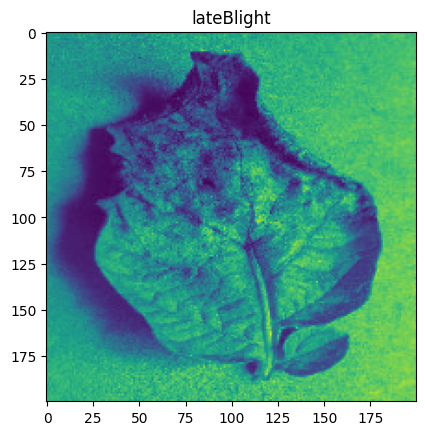

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


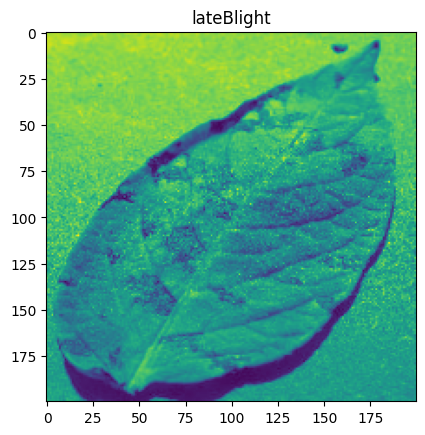

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


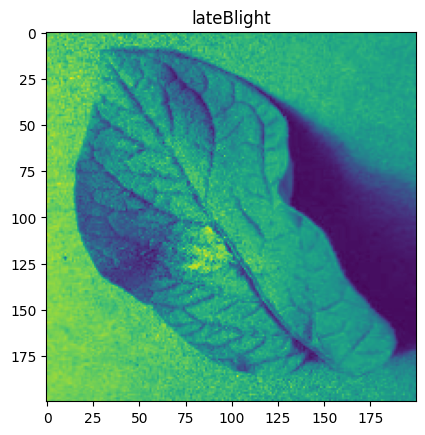

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[0]


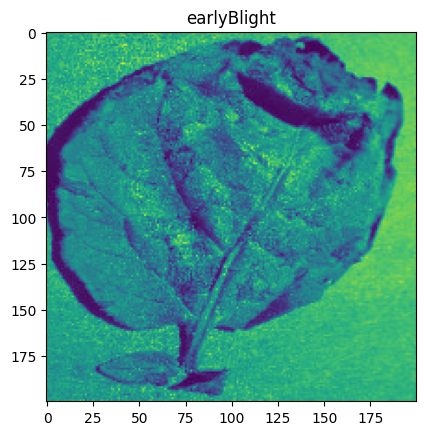

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


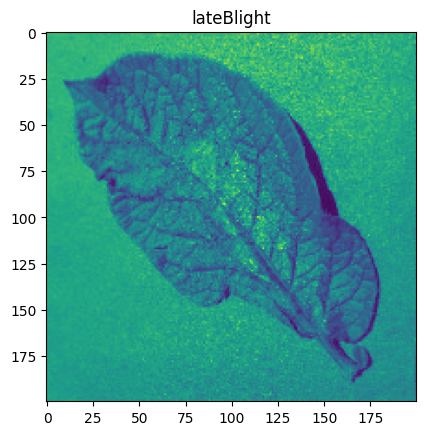

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


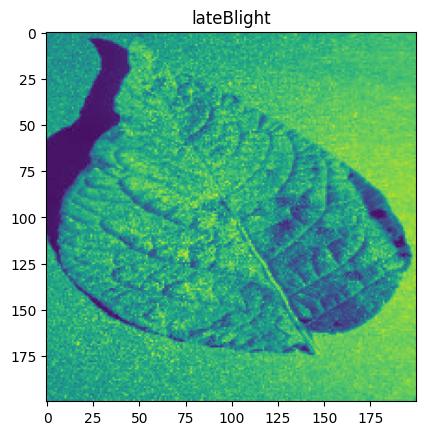

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[1]


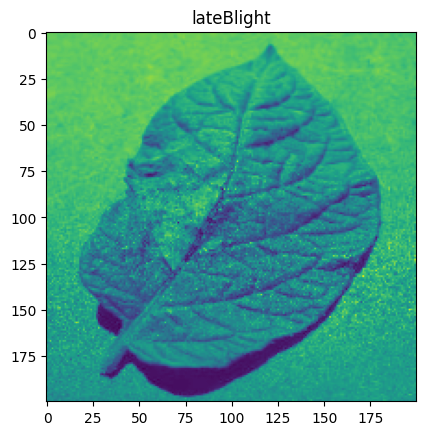

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[0]


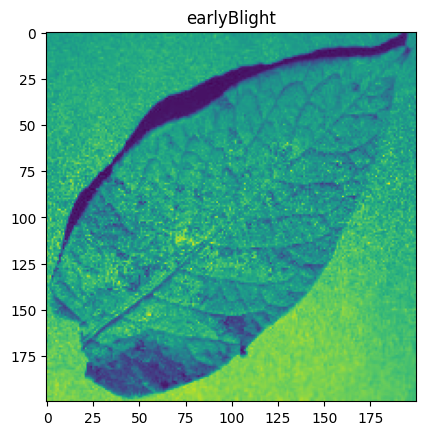

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
h :  [[0. 0. 0. ... 0. 0. 0.]]
[0]


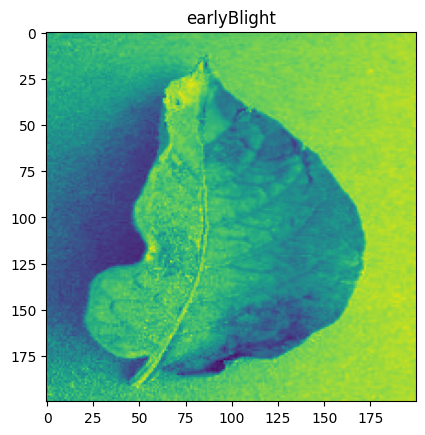

In [25]:
response = get_file_paths()
print(response)
response2 = get_randome_file_paths()
print(response2)
feature_methods.append("hog+lbp+css")
classifier =  get_hog_output(response , response2['randomeImages'])
rf = classifier['rf']

HOG + LBP + CSS EVALUATION

Training Precision: 1.0
Testing Precision: 0.976086956521739
Training Recall: 1.0
Testing Recall: 0.975
Training F1 Score: 1.0
Testing F1 Score: 0.9749206349206349


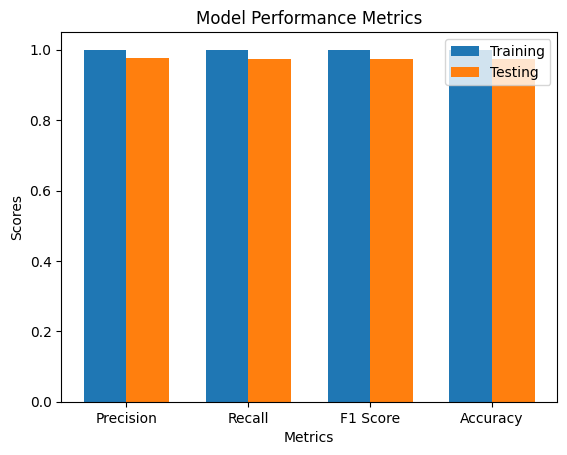

In [26]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate precision, recall, and F1 score on the training and testing data
train_precision = precision_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_precision = precision_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_recall = recall_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_recall = recall_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_f1 = f1_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_f1 = f1_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)

print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)

print("Training F1 Score:", train_f1)
print("Testing F1 Score:", test_f1)

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()

LBP+HOG + CSS EVALUATION

Training Precision: 1.0
Testing Precision: 0.976086956521739
Training Recall: 1.0
Testing Recall: 0.975
Training F1 Score: 1.0
Testing F1 Score: 0.9749206349206349


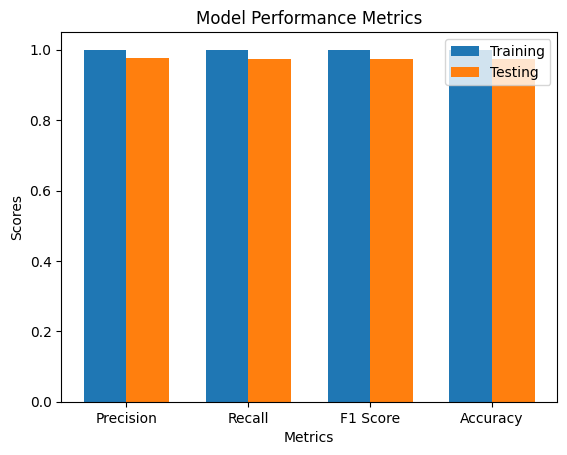

In [27]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate precision, recall, and F1 score on the training and testing data
train_precision = precision_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_precision = precision_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_recall = recall_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_recall = recall_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_f1 = f1_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_f1 = f1_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)

print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)

print("Training F1 Score:", train_f1)
print("Testing F1 Score:", test_f1)

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()

CSS IMPLEMENTATION



In [28]:
response = get_file_paths()
print(response)
feature_methods.append("css")
classifier =  get_css_output(response)
rf = classifier['rf']

{'earlyBlight': ['/content/drive/MyDrive/fungal_detection/earlyBlight/1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/060fd5a7-1606-4a59-895b-604c90d6b414___RS_Early.B 7205.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early.B 8170.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/096a2c48-104c-4570-9e34-8dd60aa5ebcf___RS_Early.B 6979.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/08a892eb-19cc-45ea-babc-181b98f89238___RS_Early.B 7367.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/10a3920b-dd04-406d

CSS EVALUATION

Training Precision: 1.0
Testing Precision: 0.6547619047619047
Training Recall: 1.0
Testing Recall: 0.6285714285714286
Training F1 Score: 1.0
Testing F1 Score: 0.6285714285714286


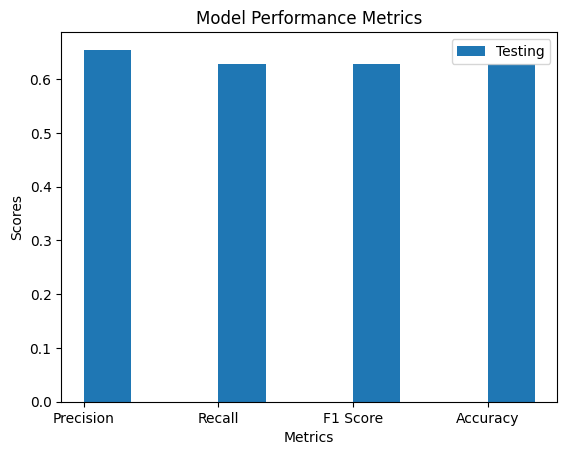

In [29]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate precision, recall, and F1 score on the training and testing data
train_precision = precision_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_precision = precision_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_recall = recall_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_recall = recall_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_f1 = f1_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_f1 = f1_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)

print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)

print("Training F1 Score:", train_f1)
print("Testing F1 Score:", test_f1)

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
#plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()

SIFT IMPLEMENTATION

In [30]:
response = get_file_paths()
print(response)
feature_methods.append("sift")
classifier = get_sift_output(response)
rf = classifier['rf']

{'earlyBlight': ['/content/drive/MyDrive/fungal_detection/earlyBlight/1328ae8b-76e1-42e9-a0c4-7dd0612fdf99___RS_Early.B 8303.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/060fd5a7-1606-4a59-895b-604c90d6b414___RS_Early.B 7205.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early.B 8170.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/096a2c48-104c-4570-9e34-8dd60aa5ebcf___RS_Early.B 6979.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/08a892eb-19cc-45ea-babc-181b98f89238___RS_Early.B 7367.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG', '/content/drive/MyDrive/fungal_detection/earlyBlight/10a3920b-dd04-406d

<ipython-input-19-a2034a9ec279>:37: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if sift == "small":


[[  0.  56. 105. ...   5.  17.  16.]
 [ 38.   6.   0. ...   0.   0.   0.]
 [ 46.   1.   0. ...   2.   2.   0.]
 ...
 [  0.   1.   5. ...   2.   6.  30.]
 [116.   6.   0. ...   2.   8.  24.]
 [ 50.   1.   0. ...   1.   6.   1.]]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
203.0 0.0
207.0 0.0
0.796078431372549 0.0
0.8117647058823529 0.0
(144, 128) (36, 128)
Training Score: 1.0
Testing Score RandomClassifier: 0.5555555555555556


SIFT EVALUATION

Training Precision: 1.0
Testing Precision: 0.5168650793650793
Training Recall: 1.0
Testing Recall: 0.5555555555555556
Training F1 Score: 1.0
Testing F1 Score: 0.5216161616161616


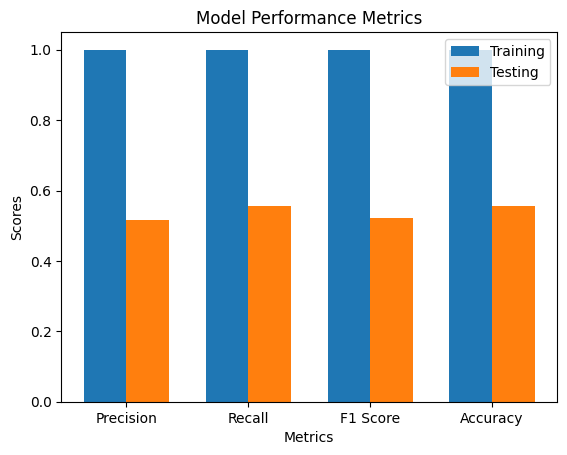

In [31]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate precision, recall, and F1 score on the training and testing data
train_precision = precision_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_precision = precision_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_recall = recall_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_recall = recall_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_f1 = f1_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_f1 = f1_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)

print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)

print("Training F1 Score:", train_f1)
print("Testing F1 Score:", test_f1)

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()

Final Comparison Graph

['lbp', 'hog+lbp+css', 'css', 'sift', 'hog', 'hog'] [0.55, 0.975, 0.6285714285714286, 0.5555555555555556, 0.79, 0.79]


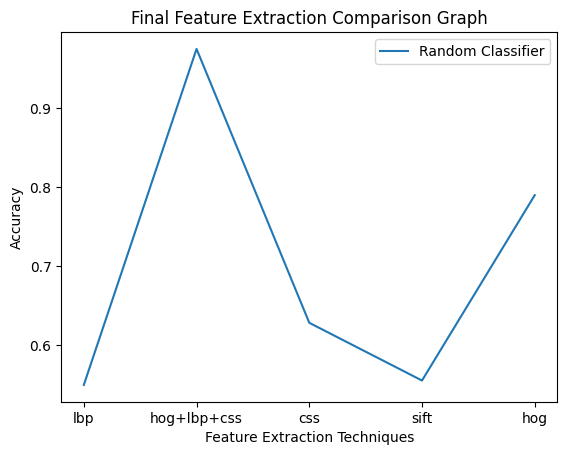

In [35]:
import matplotlib.pyplot as plt

# line 1 points
# plotting the line 1 points
random_accuracy.append(0.79)
feature_methods.append("hog")
print(feature_methods , random_accuracy)
# random_accuracy.append(0.5588235294117647)
plt.plot(feature_methods, random_accuracy, label="Random Classifier")

# line 2 points
# plotting the line 2 points
# svm_accuracy.append(0.5588)
# plt.plot(feature_methods, svm_accuracy, label="SVM Classifier")

# naming the x axis
plt.xlabel('Feature Extraction Techniques')
# naming the y axis
plt.ylabel('Accuracy')
# giving a title to my graph
plt.title('Final Feature Extraction Comparison Graph')

# show a legend on the plot
plt.legend()

# function to show the plot
plt.show()

===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

EVALUATION

Training Precision: 1.0
Testing Precision: 0.5168650793650793
Training Recall: 1.0
Testing Recall: 0.5555555555555556
Training F1 Score: 1.0
Testing F1 Score: 0.5216161616161616


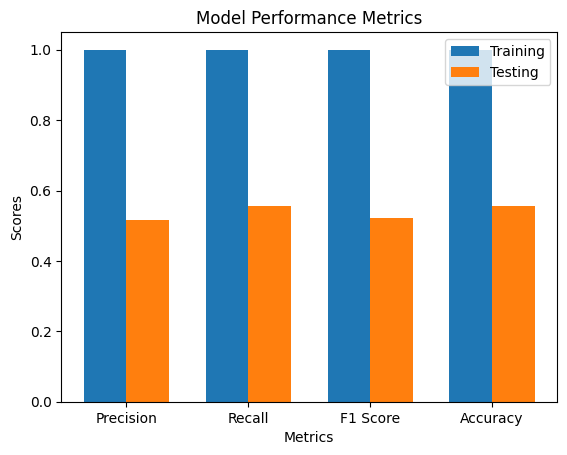

In [33]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate precision, recall, and F1 score on the training and testing data
train_precision = precision_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_precision = precision_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_recall = recall_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_recall = recall_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

train_f1 = f1_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']), average='weighted')
test_f1 = f1_score(rf['ytest'], rf['rf'].predict(rf['pca_test']), average='weighted')

print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)

print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)

print("Training F1 Score:", train_f1)
print("Testing F1 Score:", test_f1)

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()

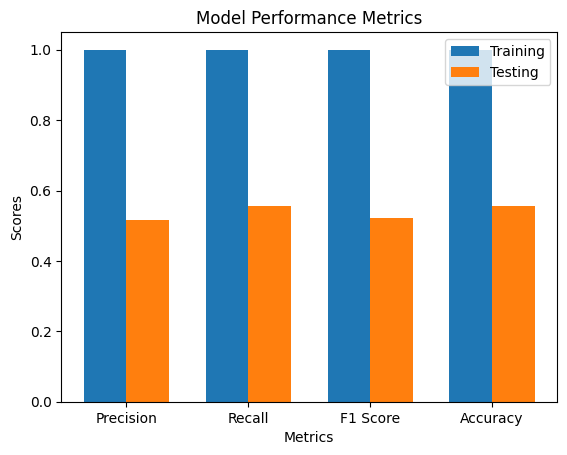

In [34]:
import matplotlib.pyplot as plt
import numpy as np

train_accuracy = accuracy_score(rf['ytrain'], rf['rf'].predict(rf['pca_train']))
test_accuracy = accuracy_score(rf['ytest'], rf['rf'].predict(rf['pca_test']))

metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
train_scores = [train_precision, train_recall, train_f1, train_accuracy]
test_scores = [test_precision, test_recall, test_f1, test_accuracy]

# Set the positions of the bars on the x-axis
x = np.arange(len(metrics))

# Set the width of the bars
width = 0.35

# Plot the training scores
plt.bar(x - width/2, train_scores, width, label='Training')
# Plot the testing scores
plt.bar(x + width/2, test_scores, width, label='Testing')

# Set the x-axis labels
plt.xlabel('Metrics')
# Set the y-axis label
plt.ylabel('Scores')
# Set the title
plt.title('Model Performance Metrics')

# Set the tick labels on the x-axis
plt.xticks(x, metrics)
# Set the legend
plt.legend()

# Show the plot
plt.show()